Group - 11 - Project Code
Below Cell Shows the Exploratory Data Analysis (EDA)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\puppa\Desktop\Shashank\Shashank\Shashank_Masters\UMBC\Second Semester Course\IS-733\profiling_report.html

C:\Users\puppa\AppData\Local\Temp\ipykernel_16608\2279510768.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\puppa\AppData\Local\Temp\ipykernel_16608\2279510768.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\puppa\AppData\Local\Temp\ipykernel_16608\2279510768.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\puppa\AppData\Local\Temp\ipykernel_16608\2279510768.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xti

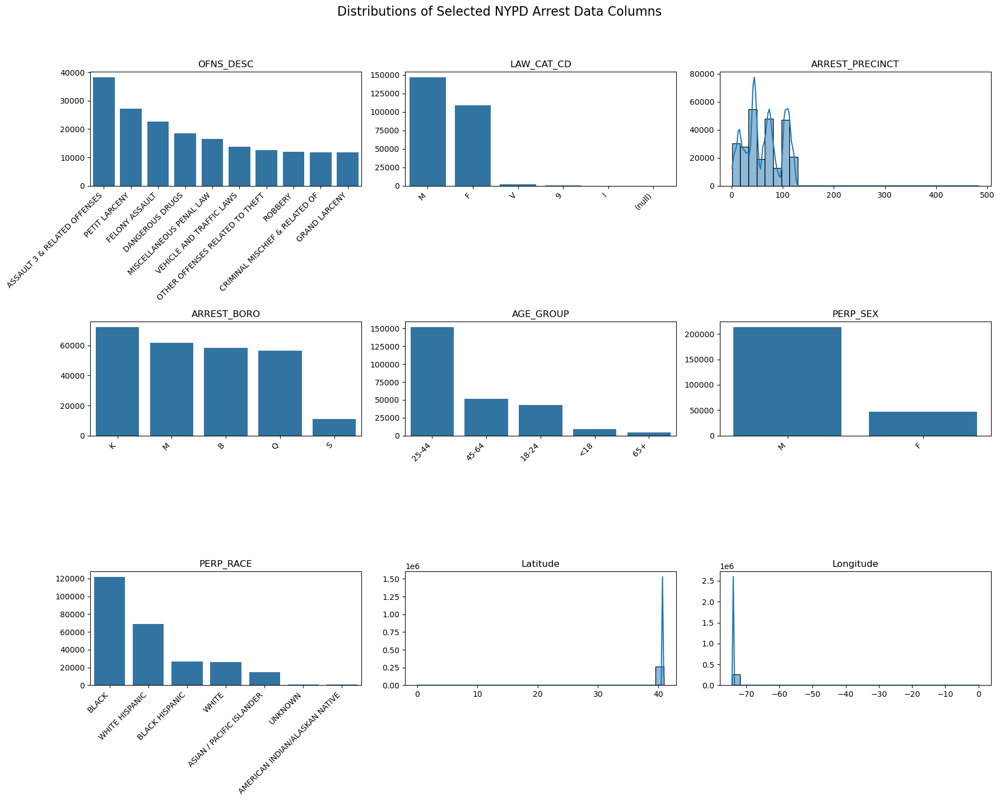

In [35]:
# Exploratory Data Analysis (EDA)

%matplotlib inline

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from IPython.display import display, FileLink


file_path = "https://raw.githubusercontent.com/UB01976/is7332025/refs/heads/main/data-mining-project-repo/Group_11_Project/NYPD_Arrest_Data__Year_to_Date.csv"
df = pd.read_csv(file_path) 

profile = ProfileReport(df, title="YData Profiling Report", explorative=True)
profile.to_notebook_iframe() 
profile.to_file("profiling_report.html")

display(FileLink("profiling_report.html"))

selected_columns = [
    'OFNS_DESC', 'LAW_CAT_CD', 'ARREST_PRECINCT', 'ARREST_BORO',
    'AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'Latitude', 'Longitude'
]

fig, axes = plt.subplots(3, 3, figsize=(18, 15))
fig.suptitle("Distributions of Selected NYPD Arrest Data Columns", fontsize=16)
axes = axes.flatten()

for i, column in enumerate(selected_columns):
    ax = axes[i]
    if df[column].dtype == 'object' or df[column].dtype.name == 'category':
        sns.countplot(data=df, x=column, order=df[column].value_counts().index[:10], ax=ax)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    else:
        sns.histplot(df[column], kde=True, bins=30, ax=ax)
    ax.set_title(f'{column}')
    ax.set_xlabel('')
    ax.set_ylabel('')

for j in range(len(selected_columns), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [11]:
# Data Pre-processing:
import pandas as pd
from IPython.display import FileLink

file_path = "https://raw.githubusercontent.com/UB01976/is7332025/refs/heads/main/data-mining-project-repo/Group_11_Project/NYPD_Arrest_Data__Year_to_Date.csv"
df = pd.read_csv(file_path) 

df = df.drop(columns=['ARREST_KEY', 'ARREST_DATE', 'PD_CD', 'PD_DESC', 'KY_CD', 'LAW_CODE', 'X_COORD_CD', 'Y_COORD_CD', 'JURISDICTION_CODE', 'New Georeferenced Column'])

df = df.dropna()

df.to_csv('modified_dataset.csv', index = False)
FileLink('modified_dataset.csv')

C:\Users\puppa\Desktop\Shashank\Shashank\Shashank_Masters\UMBC\Second Semester Course\IS-733\modified_dataset.csv

Model 1 - K-Means Clustering Model

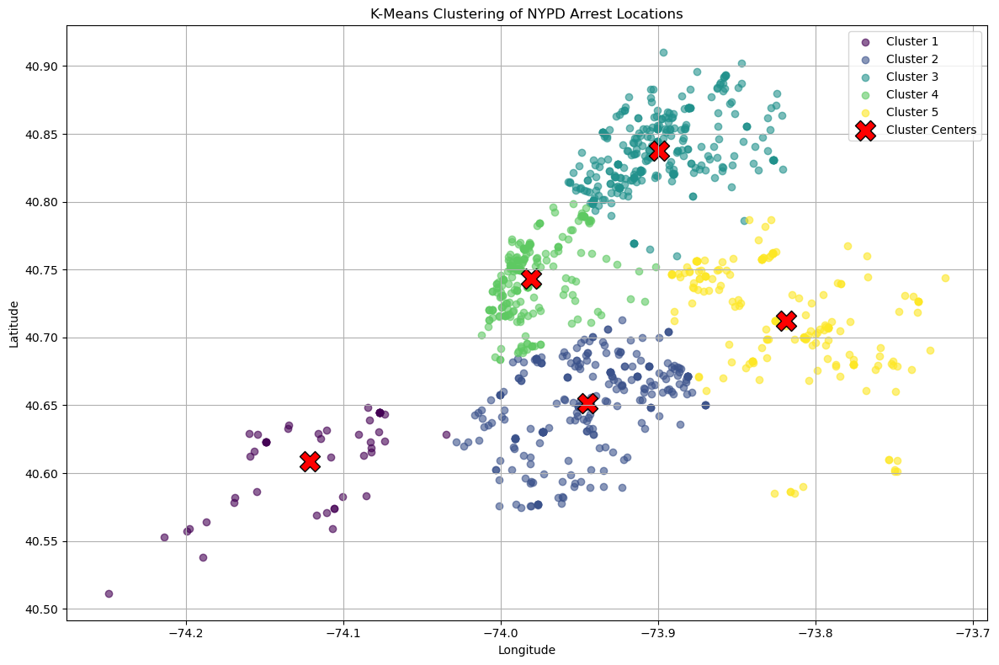

Cluster Centers (Latitude, Longitude):
Cluster 1: (40.6090, -74.1215)
Cluster 2: (40.6518, -73.9449)
Cluster 3: (40.8374, -73.8996)
Cluster 4: (40.7431, -73.9809)
Cluster 5: (40.7122, -73.8190)


In [13]:
# Modelling:

# Model 1:

import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

file_path = "https://raw.githubusercontent.com/UB01976/is7332025/refs/heads/main/data-mining-project-repo/Group_11_Project/modified_dataset.csv"
data = pd.read_csv(file_path) 
data = data.dropna(subset=['Latitude', 'Longitude'])
data = data[(data['Latitude'] != 0) & (data['Longitude'] != 0)]

sample_data = data.sample(n=1000, random_state=42)
coordinates = sample_data[['Latitude', 'Longitude']].values

scaler = StandardScaler()
scaled_coords = scaler.fit_transform(coordinates)

kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(scaled_coords)

cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)

sample_data['Cluster'] = kmeans.labels_

plt.figure(figsize=(12, 8))
colors = plt.cm.viridis(np.linspace(0, 1, 5))
for cluster_id in range(5):
    cluster_data = sample_data[sample_data['Cluster'] == cluster_id]
    plt.scatter(cluster_data['Longitude'], cluster_data['Latitude'],
                color=colors[cluster_id], alpha=0.6, label=f'Cluster {cluster_id + 1}')

plt.scatter(cluster_centers[:, 1], cluster_centers[:, 0], 
            s=300, c='red', marker='X', edgecolor='black', label='Cluster Centers')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('K-Means Clustering of NYPD Arrest Locations')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("NYPD_Clusters.png")
plt.show()

print("Cluster Centers (Latitude, Longitude):")
for idx, center in enumerate(cluster_centers, 1):
    print(f"Cluster {idx}: ({center[0]:.4f}, {center[1]:.4f})")


Model 2 - Hierarchical Clustering Model

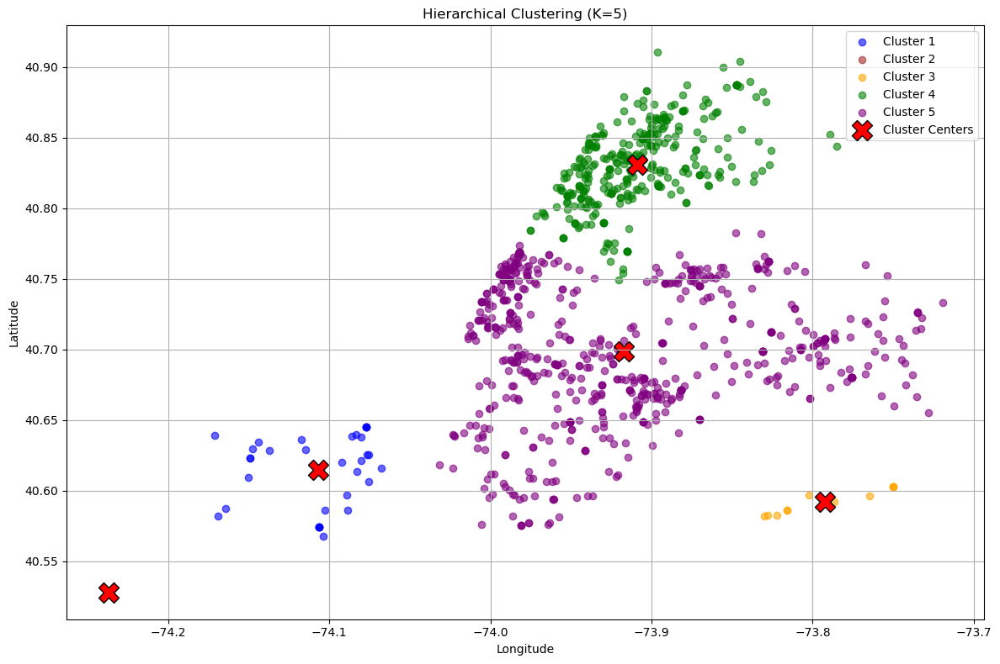

Cluster Centers (Latitude, Longitude):
Cluster 1: (40.6146, -74.1070)
Cluster 2: (40.5281, -74.2371)
Cluster 3: (40.5921, -73.7923)
Cluster 4: (40.8305, -73.9091)
Cluster 5: (40.6985, -73.9170)


In [15]:
# Model 2:

import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist
import matplotlib.pyplot as plt

file_path = "https://raw.githubusercontent.com/UB01976/is7332025/refs/heads/main/data-mining-project-repo/Group_11_Project/modified_dataset.csv"
data = pd.read_csv(file_path) 

if len(df) > 1000:
    df = df.sample(n=1000, random_state=42)

coords_deg = df[['Latitude', 'Longitude']].values
coords_rad = np.radians(coords_deg)

def haversine(u, v):
    R = 6371.0088 
    dlat = v[0] - u[0]
    dlon = v[1] - u[1]
    a = np.sin(dlat / 2)**2 + np.cos(u[0]) * np.cos(v[0]) * np.sin(dlon / 2)**2
    return 2 * R * np.arcsin(np.sqrt(a))

dist_matrix = pdist(coords_rad, metric=haversine)
Z = linkage(dist_matrix, method='average')

max_clusters = 5
df['cluster'] = fcluster(Z, t=max_clusters, criterion='maxclust')

cluster_centers = df.groupby('cluster')[['Latitude', 'Longitude']].mean()

custom_colors = ['blue', 'brown', 'orange', 'green', 'purple']

plt.figure(figsize=(12, 8))
for i, cluster_id in enumerate(sorted(df['cluster'].unique())):
    cluster = df[df['cluster'] == cluster_id]
    color = custom_colors[i % len(custom_colors)]
    plt.scatter(cluster['Longitude'], cluster['Latitude'], 
                color=color, alpha=0.6, label=f'Cluster {cluster_id}')

plt.scatter(cluster_centers['Longitude'], cluster_centers['Latitude'],
            marker='X', s=300, c='red', edgecolor='black', label='Cluster Centers')

plt.title(f'Hierarchical Clustering (K={max_clusters})')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("NYPD_Clusters_HC.png")
plt.show()

print("Cluster Centers (Latitude, Longitude):")
for idx, row in cluster_centers.iterrows():
    print(f"Cluster {idx}: ({row['Latitude']:.4f}, {row['Longitude']:.4f})")


Model 3 - DBSCAN Model

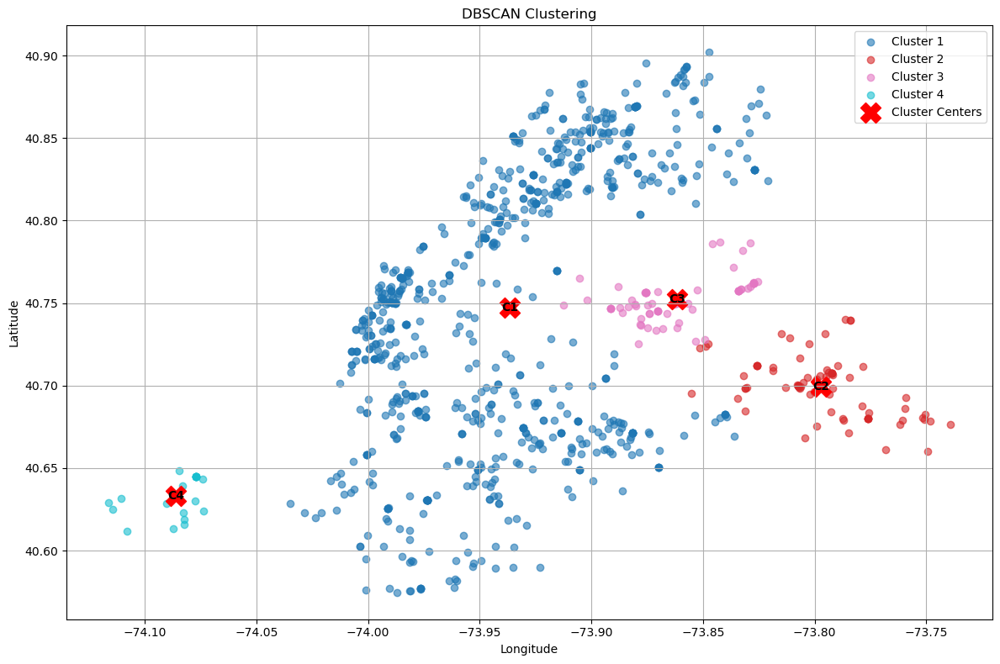

Cluster Centers (Latitude, Longitude):

Cluster 1 center: (40.7472, -73.9367)

Cluster 2 center: (40.6993, -73.7970)

Cluster 3 center: (40.7525, -73.8616)

Cluster 4 center: (40.6332, -74.0861)


In [27]:
# Model 3:

import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

file_path = "https://raw.githubusercontent.com/UB01976/is7332025/refs/heads/main/data-mining-project-repo/Group_11_Project/modified_dataset.csv"
df = pd.read_csv(file_path) 
df = df.dropna(subset=['Latitude', 'Longitude'])
df = df[(df['Latitude'] != 0) & (df['Longitude'] != 0)]

if len(df) > 1000:
    df = df.sample(n=1000, random_state=42)

coords_deg = df[['Latitude', 'Longitude']].values
coords_rad = np.radians(coords_deg)

epsilon_km = 2.6
epsilon_rad = epsilon_km / 6371.0088
min_samples = 21

db = DBSCAN(eps=epsilon_rad, min_samples=min_samples, metric='haversine')
labels = db.fit_predict(coords_rad)
df['cluster'] = labels

df_clusters = df[df['cluster'] != -1]

cluster_centers = df_clusters.groupby('cluster')[['Latitude', 'Longitude']].mean()

plt.figure(figsize=(12, 8))
unique_labels = sorted(df_clusters['cluster'].unique())
colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))

for i, (label, color) in enumerate(zip(unique_labels, colors), 1):
    cluster = df_clusters[df_clusters['cluster'] == label]
    plt.scatter(cluster['Longitude'], cluster['Latitude'], c=[color], alpha=0.6, label=f'Cluster {i}')
    center_lat, center_lon = cluster_centers.loc[label]
    plt.text(center_lon, center_lat, f'C{i}', fontsize=10, fontweight='bold', ha='center', va='center', color='black')

plt.scatter(cluster_centers['Longitude'], cluster_centers['Latitude'],
            marker='X', s=300, c='red', label='Cluster Centers')

plt.title('DBSCAN Clustering')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("NYPD_Clusters_DBSCN.png")
plt.show()

print("Cluster Centers (Latitude, Longitude):")
for i, (label, row) in enumerate(cluster_centers.iterrows(), 1):
    print(f"\nCluster {i} center: ({row['Latitude']:.4f}, {row['Longitude']:.4f})")

Crime Profiling of NYPD Data:-

In [25]:
# Crime Profiling:

import pandas as pd

# Load dataset
file_path = "https://raw.githubusercontent.com/UB01976/is7332025/refs/heads/main/data-mining-project-repo/Group_11_Project/modified_dataset.csv"
df = pd.read_csv(file_path) 

# Clean data
df = df.dropna(subset=['LAW_CAT_CD', 'AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'OFNS_DESC'])

# Replace codes with full forms
sex_map = {'M': 'Male', 'F': 'Female'}
law_map = {'F': 'Felony', 'M': 'Misdemeanor', 'V': 'Violation'}
df['PERP_SEX'] = df['PERP_SEX'].map(sex_map)
df['LAW_CAT_CD'] = df['LAW_CAT_CD'].map(law_map)

# Group by key demographics and offense description
profile_counts = df.groupby([
    'LAW_CAT_CD',
    'AGE_GROUP',
    'PERP_SEX',
    'PERP_RACE',
    'OFNS_DESC'
]).size().reset_index(name='Count')

# Top 10 most frequent profiles
top_profiles = profile_counts.sort_values(by='Count', ascending=False).head(10)

# Display summaries with profile numbers and two lines for each profile
for i, (_, row) in enumerate(top_profiles.iterrows(), start=1):
    print(f" {i}.{row['PERP_RACE']} {row['PERP_SEX']} aged {row['AGE_GROUP']} committed {int(row['Count'])} {row['LAW_CAT_CD']} crimes ")
    print(f"   ({row['OFNS_DESC']})\n")

 1.BLACK Male aged 25-44 committed 7188 Misdemeanor crimes 
   (ASSAULT 3 & RELATED OFFENSES)

 2.WHITE HISPANIC Male aged 25-44 committed 4957 Misdemeanor crimes 
   (ASSAULT 3 & RELATED OFFENSES)

 3.BLACK Male aged 25-44 committed 4603 Felony crimes 
   (FELONY ASSAULT)

 4.BLACK Male aged 25-44 committed 4495 Misdemeanor crimes 
   (OTHER OFFENSES RELATED TO THEFT)

 5.BLACK Male aged 25-44 committed 4297 Misdemeanor crimes 
   (PETIT LARCENY)

 6.BLACK Male aged 25-44 committed 4110 Felony crimes 
   (MISCELLANEOUS PENAL LAW)

 7.BLACK Male aged 25-44 committed 3664 Misdemeanor crimes 
   (VEHICLE AND TRAFFIC LAWS)

 8.WHITE HISPANIC Male aged 25-44 committed 3402 Misdemeanor crimes 
   (PETIT LARCENY)

 9.BLACK Male aged 45-64 committed 3097 Misdemeanor crimes 
   (PETIT LARCENY)

 10.BLACK Female aged 25-44 committed 3038 Misdemeanor crimes 
   (ASSAULT 3 & RELATED OFFENSES)



In [29]:
# Evaluation and Results:

import pandas as pd
import numpy as np
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist

# Load your cleaned dataset
file_path = "https://raw.githubusercontent.com/UB01976/is7332025/refs/heads/main/data-mining-project-repo/Group_11_Project/modified_dataset.csv"
df = pd.read_csv(file_path) 
df = df.dropna(subset=["Latitude", "Longitude"])
df = df[(df["Latitude"] != 0) & (df["Longitude"] != 0)]
sample_df = df.sample(n=1000, random_state=42)
coords = sample_df[["Latitude", "Longitude"]].values

# KMeans clustering
scaler = StandardScaler()
scaled_coords = scaler.fit_transform(coords)
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans_labels = kmeans.fit_predict(scaled_coords)
kmeans_score = silhouette_score(scaled_coords, kmeans_labels)

# Hierarchical clustering using Haversine
coords_rad = np.radians(coords)
def haversine(u, v):
    R = 6371.0088
    dlat = v[0] - u[0]
    dlon = v[1] - u[1]
    a = np.sin(dlat / 2)**2 + np.cos(u[0]) * np.cos(v[0]) * np.sin(dlon / 2)**2
    return 2 * R * np.arcsin(np.sqrt(a))

dist_matrix = pdist(coords_rad, metric=haversine)
Z = linkage(dist_matrix, method='average')
hc_labels = fcluster(Z, t=5, criterion='maxclust')
hc_score = silhouette_score(coords, hc_labels)

# DBSCAN
db = DBSCAN(eps=0.01, min_samples=5)
db_labels = db.fit_predict(coords)
if np.any(db_labels != -1) and len(set(db_labels)) > 1:
    db_score = silhouette_score(coords[db_labels != -1], db_labels[db_labels != -1])
else:
    db_score = -1

print("Silhouette Scores:")
print(f"KMeans: {kmeans_score:.4f}")
print(f"Hierarchical: {hc_score:.4f}")
print(f"DBSCAN: {db_score:.4f}")

Silhouette Scores:
KMeans: 0.4776
Hierarchical: 0.4568
DBSCAN: 0.0541


In [31]:
!pip install folium
!pip install geopy

import pandas as pd
from sklearn.cluster import KMeans
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import folium
from IPython.display import display, IFrame

file_path = "https://raw.githubusercontent.com/UB01976/is7332025/refs/heads/main/data-mining-project-repo/Group_11_Project/modified_dataset.csv"
df = pd.read_csv(file_path) 

coordinates = df[['Latitude', 'Longitude']].dropna().sample(n=1000, random_state=42)

kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
coordinates['Cluster'] = kmeans.fit_predict(coordinates)

hotspots = pd.DataFrame(kmeans.cluster_centers_, columns=['Latitude', 'Longitude'])

geolocator = Nominatim(user_agent="nypd_crime_analysis")
reverse = RateLimiter(geolocator.reverse, min_delay_seconds=1)

def get_location_name(lat, lon):
    try:
        location = reverse((lat, lon))
        return location.address if location else "Unavailable"
    except:
        return "Unavailable"

hotspots['Location'] = hotspots.apply(lambda row: get_location_name(row['Latitude'], row['Longitude']), axis=1)

nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

for _, row in coordinates.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=2,
        color='blue',
        fill=True,
        fill_opacity=0.4
    ).add_to(nyc_map)

for _, row in hotspots.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=row['Location'],
        icon=folium.Icon(color='red', icon='fire')
    ).add_to(nyc_map)

map_output_path = "NYPD_Crime_Hotspots_Map.html"
nyc_map.save(map_output_path)

pd.set_option('display.max_colwidth', None)
print('Crime Hotspots in NewYork City:')
display(hotspots)
print('Interactive map with Crimes and Crime Hotspots in NewYork City:')
display(IFrame("NYPD_Crime_Hotspots_Map.html", width=900, height=600))

Crime Hotspots in NewYork City:


,Latitude,Longitude,Location
0,40.831642,-73.907116,"Public School 132, Washington Avenue, Gouverneur Morris Houses, The Bronx, Bronx County, City of New York, New York, 10456, United States"
1,40.612249,-74.040149,"Shore Road Greenway, Fort Hamilton, Brooklyn, Kings County, City of New York, New York, 11209, United States"
2,40.666409,-73.922269,"669, Ralph Avenue, Brownsville, Brooklyn, Kings County, City of New York, New York, 11212, United States"
3,40.736016,-73.982623,"Wholesome Organic Gourmet Market, 343, 2nd Avenue, Kips Bay, Manhattan Community Board 6, Manhattan, New York County, City of New York, New York, 10003, United States"
4,40.712856,-73.816402,"The Eden Rock, Lander Street, Jamaica, Queens, Queens County, City of New York, New York, 11435, United States"


Interactive map with Crimes and Crime Hotspots in NewYork City:
